## Encoder-Only Transformers

Summarizing Documents with Text Clustering and Topic Modeling

## Load the data



In [1]:
!pip install bertopic datasets datamapplot WordCloud


[notice] A new release of pip is available: 25.3 -> 26.0.1
[notice] To update, run: pip install --upgrade pip


In [2]:
# Load the data directly from huggingface using their datasets module
from datasets import load_dataset

dataset = load_dataset("maartengr/arxiv_nlp")["train"]
dataset

/Users/odysseasgeorgiades/Desktop/Neural Networks/.venv/lib/python3.14/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Dataset({
    features: ['Titles', 'Abstracts', 'Years', 'Categories'],
    num_rows: 44949
})

In [3]:

abstracts = dataset["Abstracts"]
titles = dataset["Titles"]

abstracts[0:2]

['  In this paper Arabic was investigated from the speech recognition problem\npoint of view. We propose a novel approach to build an Arabic Automated Speech\nRecognition System (ASR). This system is based on the open source CMU Sphinx-4,\nfrom the Carnegie Mellon University. CMU Sphinx is a large-vocabulary;\nspeaker-independent, continuous speech recognition system based on discrete\nHidden Markov Models (HMMs). We build a model using utilities from the\nOpenSource CMU Sphinx. We will demonstrate the possible adaptability of this\nsystem to Arabic voice recognition.\n',
 '  In this paper we present the creation of an Arabic version of Automated\nSpeech Recognition System (ASR). This system is based on the open source\nSphinx-4, from the Carnegie Mellon University. Which is a speech recognition\nsystem based on discrete hidden Markov models (HMMs). We investigate the\nchanges that must be made to the model to adapt Arabic voice recognition.\n  Keywords: Speech recognition, Acoustic mo

## Text Clustering

We will
1. Convert the input documents to embeddings with an embedding model. We will use SBERT (SentenceTransformers) to create the embeddings. SBERT is an Encoder-Only Transformer 
2. Reduce the dimensionality of embeddings with a dimensionality reduction model. We will use UMAP to reduce the dimensions of the model.
3. Find groups of semantically similar dociments with a cluster model. We will use HDBSCAN ( a hierarchical version of DBSCAN).  

### Convert the abstracts into embeddings

The pre-trained SBERT model is a gte-small model (a 33 million parameters General Text Embeddings). This model only accepts 512 tokens and any input longer than that is shortened.

In [4]:
from sentence_transformers import SentenceTransformer

# download the pre-trained SBERT model
embedding_model = SentenceTransformer('thenlper/gte-small')

# create the embeddings for the abstracts
embeddings = embedding_model.encode(abstracts, show_progress_bar=True)


Loading weights: 100%|██████████| 199/199 [00:00<00:00, 10668.44it/s]
BertModel LOAD REPORT from: thenlper/gte-small
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED:	can be ignored when loading from different task/architecture; not ok if you expect identical arch.
Batches: 100%|██████████| 1405/1405 [09:29<00:00,  2.47it/s]


In [5]:
# check the dimensions of the resulting embeddings
embeddings.shape

(44949, 384)

### Reduce the Dimensionality of Embeddings

gte-small is a general-purpose model designed to perform well given a wide variety of tasks (like classification and ranging). As a result it creates more mebedding values than we need for clustering. Too many embedding values or dimensions results in sparse data that can be difficult to cluster and is an example of the Curse of Dimensionality.

We will use UMAP (Uniform Manifold Approxination and Projection) to reduce the dimensions from 384 to 5.

In [6]:
from umap import UMAP

# We reduce the input embeddings from 384 dimensions to 5 dimensions
umap_model = UMAP(
    n_components=5,
    min_dist=0.0,
    metric='cosine',
    random_state=42
)

reduced_embeddings_5 = umap_model.fit_transform(embeddings)

# We look at the dimensions of the reduced embeddings
reduced_embeddings_5.shape

/Users/odysseasgeorgiades/Desktop/Neural Networks/.venv/lib/python3.14/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


(44949, 5)

### Cluster the Reduced Embeddings

Now that we have reduced the dimensions from 384 to 5, we try to find clusters using HDBSCAN.

In [7]:
from hdbscan import HDBSCAN

# We find and label clusters
hdbscan_model = HDBSCAN(
    min_cluster_size=50, # Each cluster must have >= 50 documents in
    metric = 'euclidean', # clustering is based on euclidean distance
    cluster_selection_method='eom' # eom = Excess of Mass (its the default clustering selection method)
).fit(reduced_embeddings_5)
clusters = hdbscan_model.labels_

In [8]:
# We print the number of clusters
len(set(clusters)) # set() removes duplicates so that we only count unique cluster labels

166

In [9]:
import numpy as np
# We look at cluster 0
cluster = 0
for index in np.where(clusters==cluster)[0][:3]:
    print(abstracts[int(index)][:300] + "...\n")

  This works aims to design a statistical machine translation from English text
to American Sign Language (ASL). The system is based on Moses tool with some
modifications and the results are synthesized through a 3D avatar for
interpretation. First, we translate the input text to gloss, a written fo...

  Researches on signed languages still strongly dissociate lin- guistic issues
related on phonological and phonetic aspects, and gesture studies for
recognition and synthesis purposes. This paper focuses on the imbrication of
motion and meaning for the analysis, synthesis and evaluation of sign lang...

  Modern computational linguistic software cannot produce important aspects of
sign language translation. Using some researches we deduce that the majority of
automatic sign language translation systems ignore many aspects when they
generate animation; therefore the interpretation lost the truth inf...



/Users/odysseasgeorgiades/Desktop/Neural Networks/.venv/lib/python3.14/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


(np.float64(-7.206364917755127),
 np.float64(11.1045392036438),
 np.float64(-7.964781951904297),
 np.float64(11.743842315673827))

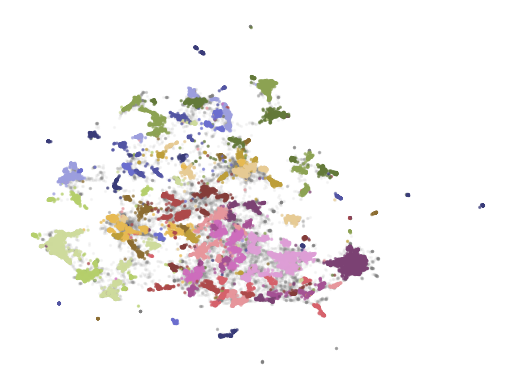

In [10]:
# We draw a 2-d graph of the clusters

import pandas as pd
import matplotlib.pyplot as plt

# We reduce 384 dimensional embeddings to 2 dimensions for easier visualization
reduced_embeddings_2 = UMAP(
    n_components=2,
    min_dist=0.0,
    metric='cosine',
    random_state=42
).fit_transform(embeddings)

# Next we create a Dataframe
df = pd.DataFrame(reduced_embeddings_2, columns=['x', 'y'])
df['title'] = titles
df['cluster'] = [str(c) for c in clusters]

# Then we select outliers and non-outliers (clusters)
clusters_df = df.loc[df.cluster != '-1', :]
outliers_df = df.loc[df.cluster == '-1', :]

# We plot outliers and non-outliers 
plt.scatter(outliers_df.x, outliers_df.y, alpha=0.05, s=2, c='grey')
plt.scatter(
    clusters_df.x, clusters_df.y, c=clusters_df.cluster.astype(int), alpha=0.6, s=2, cmap='tab20b'
)
plt.axis('off')

## Topic Modeling

To generate labels for each cluster we will first generate keywords and then feed those keywords into a generative LLM to create the labels. We will use BERTopic for both steps 

### Generate Keywords

We will start by using BERTopic to do Text Clustering by first creating word embeddings, then reducing the dimensions of the embeddings and then clustering. Because we are using BERTopic this time we will also extract keywords representing each cluster. The keywords are determined with a class-based variant of Term-Frequency Inverse Document Frequency c-TF-IDF.


In [11]:
# We pass the embeddings, UMAP, DBSCAN models to BERTopic and fit it to the abstracts using the embeddings we created.

from bertopic import BERTopic

# We train the model with our previous defined models
topic_model = BERTopic(
    embedding_model=embedding_model,
    umap_model=umap_model,
    hdbscan_model = hdbscan_model,
    verbose=True
).fit(abstracts, embeddings)

2026-04-05 22:25:18,556 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2026-04-05 22:25:38,298 - BERTopic - Dimensionality - Completed ✓
2026-04-05 22:25:38,299 - BERTopic - Cluster - Start clustering the reduced embeddings
2026-04-05 22:25:38,868 - BERTopic - Cluster - Completed ✓
2026-04-05 22:25:38,872 - BERTopic - Representation - Fine-tuning topics using representation models.
2026-04-05 22:25:40,231 - BERTopic - Representation - Completed ✓


Now that we have a topic model, we can print out the keywords it selected for each topic. 
- Topic: is the topic ID number
- Count: tells us how many documents are in the cluster 
- Name: is the topic ID number appended to the first 4 keywords for a topic
- Representation: lists the keywords for a topic
- Representitive_Docs: lists the dociments with the most occurrences of the topics keywords

In [12]:
topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,15815,-1_the_of_and_to,"[the, of, and, to, in, we, language, that, for...",[ Word Representations form the core componen...
1,0,1817,0_speech_asr_recognition_end,"[speech, asr, recognition, end, acoustic, spea...",[ This paper presents a method to train end-t...
2,1,1205,1_medical_clinical_biomedical_patient,"[medical, clinical, biomedical, patient, notes...",[ Various deep learning algorithms have been ...
3,2,917,2_translation_nmt_machine_bleu,"[translation, nmt, machine, bleu, neural, engl...","[ Recently, the development of neural machine..."
4,3,835,3_hate_offensive_speech_detection,"[hate, offensive, speech, detection, toxic, so...",[ The rise of emergence of social media platf...
...,...,...,...,...,...
161,160,55,160_mixed_code_sentiment_mixing,"[mixed, code, sentiment, mixing, english, anal...",[ The usage of more than one language in the ...
162,161,54,161_long_context_window_length,"[long, context, window, length, llms, memory, ...",[ Extending the context window of large langu...
163,162,51,162_summarization_cls_lingual_cross,"[summarization, cls, lingual, cross, summaries...",[ Cross-lingual Summarization (CLS) aims at p...
164,163,51,163_reviews_opinion_summaries_summarization,"[reviews, opinion, summaries, summarization, r...",[ When faced with a large number of product r...


In [13]:
topic_model.get_topic(0)

[('speech', np.float64(0.02834938008705478)),
 ('asr', np.float64(0.018669715372629556)),
 ('recognition', np.float64(0.01382587833104341)),
 ('end', np.float64(0.010212046196105601)),
 ('acoustic', np.float64(0.01004532248987288)),
 ('speaker', np.float64(0.0073785127525546005)),
 ('wer', np.float64(0.0071792949291695045)),
 ('audio', np.float64(0.006463618696461519)),
 ('error', np.float64(0.0064448353826704295)),
 ('training', np.float64(0.006150024289199083))]

In [14]:
# We use find_topics() to search for specific topics based on a search term
topic_model.find_topics('topic modeling')

([19, -1, 48, 31, 87],
 [np.float64(0.9545481561981752),
  np.float64(0.911606024137269),
  np.float64(0.9073179975992177),
  np.float64(0.905381938661853),
  np.float64(0.9051470516653327)])

In [15]:
topic_model.topics_[titles.index('BERTopic: Neural topic modeling with a class-based TF-IDF procedure')]

19

In [16]:
# Now that we have the keywords for each topic we can use BERTopic to create a new 2-D graph of the text clusters that includes the topic labels and shows manuscript titles when the mouse moves over the points.

fig = topic_model.visualize_documents(
list(titles),
reduced_embeddings=reduced_embeddings_2, 
hide_annotations=True
)
fig.update_layout(font=dict(size=16))

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'hoverinfo': 'text',
              'hovertext': array(['BERT-CNN: a Hierarchical Patent Classifier Based on a Pre-Trained\n  Language Model',
                                  'Language model acceptability judgements are not always robust to context',
                                  'SecureBERT: A Domain-Specific Language Model for Cybersecurity', ...,
                                  'Controlling Personality-Based Stylistic Variation with Neural Natural\n  Language Generators',
                                  'Large Language Models Only Pass Primary School Exams in Indonesia: A\n  Comprehensive Test on IndoMMLU',
                                  None], shape=(15816,), dtype=object),
              'marker': {'color': '#CFD8DC', 'opacity': 0.5, 'size': 5},
              'mode': 'markers+text',
              'name': 'other',
              'showlegend': False,
              'type': 'scattergl',
              'x': {'bdata': ('WosawBkBfj8VzGVADVeQvyibhr4hvk' ... 'o1vft9rj8o5hJAPO/RP4jEO0C+X5M+'),
                    'dtype': 'f4'},
              'y': {'bdata': ('GueKwD9s6r9onmFAzDMAQAdxS8CKjz' ... 'gWwE6oBsA2maK//QgrQJ96LsCjc50+'),
                    'dtype': 'f4'}},
             {'hoverinfo': 'text',
              'hovertext': array(['Speechformer: Reducing Information Loss in Direct Speech Translation',
                                  'Improved Language Identification Through Cross-Lingual Self-Supervised\n  Learning',
                                  'Tackling data scarcity in speech translation using zero-shot\n  multilingual machine translation techniques',
                                  ..., 'Large-Scale Domain Adaptation via Teacher-Student Learning',
                                  'TranSpeech: Speech-to-Speech Translation With Bilateral Perturbation',
                                  'The THUEE System Description for the IARPA OpenASR21 Challenge'],
                                 shape=(1817,), dtype=object),
              'marker': {'opacity': 0.5, 'size': 5},
              'mode': 'markers+text',
              'name': '0_speech_asr_recognition',
              'text': array(['', '', '', ..., '', '', ''], shape=(1817,), dtype=object),
              'textfont': {'size': 12},
              'type': 'scattergl',
              'x': {'bdata': ('ZJukQDeTsECvLp1AYkOuQM8HvUB/X6' ... 'xA3kyzQFbRu0AobLdA8d6gQMBiskA='),
                    'dtype': 'f4'},
              'y': {'bdata': ('kv7IvwoK77/82+S/hDG1v+6N/7+L0L' ... 'PAr+fdvyWNAMCYrN6/AxHovwpe578='),
                    'dtype': 'f4'}},
             {'hoverinfo': 'text',
              'hovertext': array(['EMBRE: Entity-aware Masking for Biomedical Relation Extraction',
                                  'MDDial: A Multi-turn Differential Diagnosis Dialogue Dataset with\n  Reliability Evaluation',
                                  'Clinical Utility of the Automatic Phenotype Annotation in Unstructured\n  Clinical Notes: ICU Use Cases',
                                  ..., 'Results of the seventh edition of the BioASQ Challenge',
                                  'Information Extraction from Swedish Medical Prescriptions with\n  Sig-Transformer Encoder',
                                  'How to Leverage Multimodal EHR Data for Better Medical Predictions?'],
                                 shape=(1205,), dtype=object),
              'marker': {'opacity': 0.5, 'size': 5},
              'mode': 'markers+text',
              'name': '1_medical_clinical_biomedical',
              'text': array(['', '', '', ..., '', '', ''], shape=(1205,), dtype=object),
              'textfont': {'size': 12},
              'type': 'scattergl',
              'x': {'bdata': ('7WGjwAT9qcCtkbjAk9WrwPMVwsBSZa' ... 'LAJ1zCwGyepsCIcJPAJmSwwIuxt8A='),
                    'dtype': 'f4'},
              'y': {'bdata': ('8g7Qv8XRCr4T+T6/P++rv7cRZb/v7N' ... 'O/Nb9jv9eXTb7H+oq9GQ85v6BdPr8='),
                    'dtype': 'f4'}},
             {'hoverinfo': 'text',
          

### Using Generative AI to create topic labels

Now that we have the keywords, we will add a Decoder-Only LLM to the BERTopic framework to create labels.

In [17]:
# Firstly we duplicate our original topic model to easily compare the original keywords with the new labels.

# Save original representations
from copy import deepcopy
original_topics = deepcopy(topic_model.topic_representations_)

In [18]:
# We create a helper function that shows the original and the new topics.
def topics_vs_labels(original_topics, model, nr_topics=5):
    df = pd.DataFrame(columns=['Topic ID', 'Original Topics', 'New Labels'])
    for topic in range(nr_topics):
        og_words = " | ".join(list(zip(*original_topics[topic]))[0][:5])
        new_words = model.get_topic(topic)[0][0]
        df.loc[len(df)] = [topic, og_words, new_words]
    return df


In [19]:
# We generate labels from the keywords and abstracts using the "flan-t5-small" Decoder-Only LLM 

from transformers import pipeline
from bertopic.representation import TextGeneration

prompt = """I have a topic that contains the following documents:
[DOCUMENTS]

The topic is described by the following keywords: '[KEYWORDS]'.

Based on the documents and keywords, what is this topic about?"""

# Update the topic representations using Flan-T5
generator = pipeline('text-generation', model='google/flan-t5-small', device=0)
representation_model = TextGeneration(
    generator, prompt=prompt, doc_length=50, tokenizer='whitespace'
)
topic_model.update_topics(abstracts, representation_model=representation_model)

Loading weights: 100%|██████████| 190/190 [00:00<00:00, 7298.18it/s]
The tied weights mapping and config for this model specifies to tie shared.weight to lm_head.weight, but both are present in the checkpoints with different values, so we will NOT tie them. You should update the config with `tie_word_embeddings=False` to silence this warning.
The model 'T5ForConditionalGeneration' is not supported for text-generation. Supported models are ['PeftModelForCausalLM', 'AfmoeForCausalLM', 'ApertusForCausalLM', 'ArceeForCausalLM', 'AriaTextForCausalLM', 'BambaForCausalLM', 'BartForCausalLM', 'BertLMHeadModel', 'BertGenerationDecoder', 'BigBirdForCausalLM', 'BigBirdPegasusForCausalLM', 'BioGptForCausalLM', 'BitNetForCausalLM', 'BlenderbotForCausalLM', 'BlenderbotSmallForCausalLM', 'BloomForCausalLM', 'BltForCausalLM', 'CamembertForCausalLM', 'LlamaForCausalLM', 'CodeGenForCausalLM', 'CohereForCausalLM', 'Cohere2ForCausalLM', 'CpmAntForCausalLM', 'CTRLLMHeadModel', 'CwmForCausalLM', 'Data2VecTe

In [20]:
# We compare the original keywords to the new labels
topics_vs_labels(original_topics, topic_model)

,Topic ID,Original Topics,New Labels
0,0,speech | asr | recognition | end | acoustic,
1,1,medical | clinical | biomedical | patient | notes,
2,2,translation | nmt | machine | bleu | neural,
3,3,hate | offensive | speech | detection | toxic,
4,4,summarization | summaries | summary | abstract...,


/Users/odysseasgeorgiades/Desktop/Neural Networks/.venv/lib/python3.14/site-packages/datamapplot/text_placement.py:55: RuntimeWarning: invalid value encountered in divide
  recentered_label_locations / row_norm(recentered_label_locations)[:, None]


ValueError: Input contains NaN.

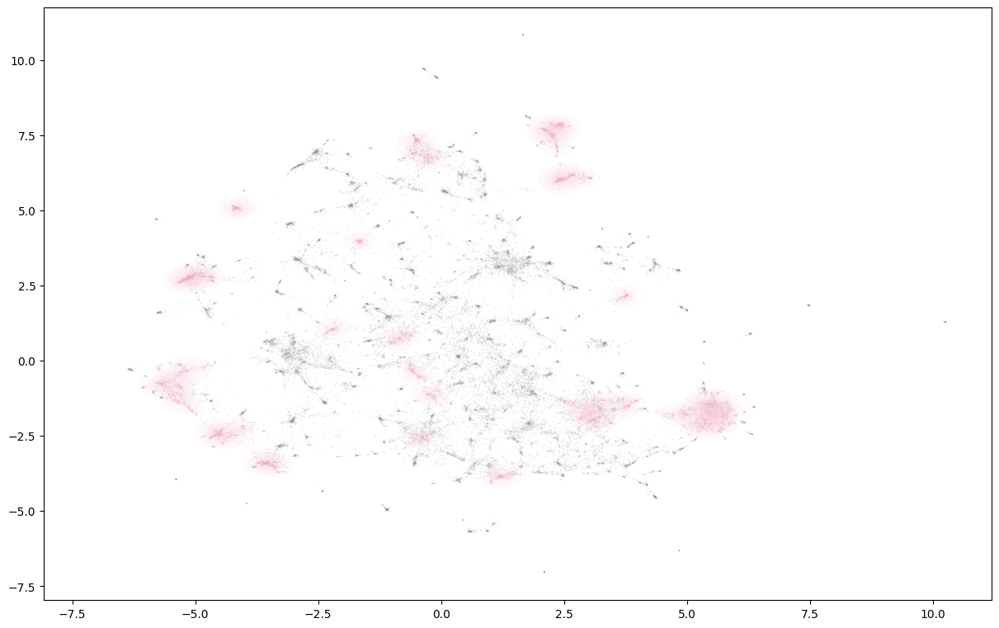

In [22]:
# We visualize the documents with labeled topics in 2-D
fig = topic_model.visualize_document_datamap(
    titles,
    topics=list(range(20)),
    reduced_embeddings=reduced_embeddings_2,
    width=1200
)

plt.savefig("datamapplot.png", dpi=300)


### Wordcloud

2026-04-05 22:29:20,832 - BERTopic - WARNING: Note that extracting more than 100 words from a sparse can slow down computation quite a bit.


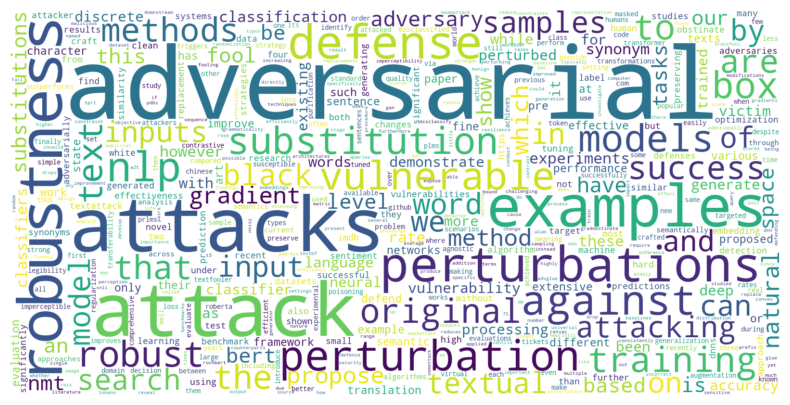

In [23]:
topic_model.update_topics(abstracts, top_n_words=500)

from wordcloud import WordCloud
import matplotlib.pyplot as plt


def create_wordcloud(model, topic):
    plt.figure(figsize=(10,5))
    text = {word: value for word, value in model.get_topic(topic)}
    wc = WordCloud(background_color="white", max_words=1000, width=1600, height=800)
    wc.generate_from_frequencies(text)
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.show()

# Show wordcloud
create_wordcloud(topic_model, topic=17)